In [22]:
import skimage.io as skio
import matplotlib.pyplot as plt
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as segmentation
import skimage
from skimage.transform import rescale, resize
from skimage.measure import label, regionprops, regionprops_table
from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops
from skimage.color import label2rgb
from sklearn.cluster import DBSCAN
from scipy.signal import find_peaks
from skimage.filters import sobel

In [23]:
!pip install -qU pytesseract

In [24]:
def line_strell(l, mode='v'):
  strell = np.ones(l) if mode == 'v' else np.ones((l[-1], l[0]))
  return strell

def rgb2gray(u):
    return 0.2989 * u[:,:,0] + 0.5870 * u[:,:,1] + 0.1140 * u[:,:,2]

def gamma_transformation(img, gamma):
    skimage.color.rgb2hsv(img)
    res = img.copy()
    res[:, :, 2] = np.clip(res[:, :, 2] ** gamma, 0, 1)
    return skimage.color.hsv2rgb(res)

def equalize_histogram(img):
    img_flat = img.flatten()
    cdf, bins = skimage.exposure.cumulative_distribution(img_flat, nbins=256)
    cdf_normalized = cdf / cdf[-1]
    img_equalized_flat = np.interp(img_flat, bins, cdf_normalized * 255).astype(np.uint8)
    new_image = img_equalized_flat.reshape(img.shape)
    return new_image

def colordistrib(imrgb,nb=3000,dpi=100):
    X = imrgb.reshape((-1,3))
    idx = np.random.randint(X.shape[0], size=(nb,))
    Xs = X[idx, :]/255.
    fig = plt.figure(dpi=dpi)
    axis = fig.add_subplot(1, 1, 1, projection="3d")
    axis.set_xlabel("Red")
    axis.set_ylabel("Green")
    axis.set_zlabel("Blue")
    axis.scatter(Xs[:, 0], Xs[:,1],Xs[:, 2],c=Xs, s=40)
    plt.show()

def show_images(images, titles=None):
    """
    Displays a list or array of images in a grid.
    
    Args:
        images (list or array): List/array of images to display.
        titles (list or array): Optional titles for each image.
        cmap (str): Colormap to use for displaying images.
    """
    num_images = len(images)
    if num_images == 1:
        plt.subplot(1,1,1)
        plt.imshow(images[0])
        plt.show()
    else:
        cols = int(np.ceil(np.sqrt(num_images)))
        rows = int(np.ceil(num_images / cols))
        
        fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
        
        for i in range(len(images)):
            axes[i].imshow(images[i])
            if titles:
                axes[i].set_title(titles[i])
            axes[i].axis('off')
       
        for i in range(len(images), len(axes)):
            axes[i].axis('off')
        
        plt.tight_layout()
        plt.show()

import matplotlib.pyplot as plt
import matplotlib.patches as patches

def visualize_bounding_boxes(image, bounding_boxes, title="Bounding Boxes"):
    """
    Visualize bounding boxes on an image.
    
    Args:
        image (ndarray): The input image (grayscale or color).
        bounding_boxes (list of tuples): List of bounding boxes in (y_min, x_min, y_max, x_max) format.
        title (str): Title for the plot.
    """
    # Create a plot
    plt.figure(figsize=(10, 10))
    plt.imshow(image, cmap='gray' if len(image.shape) == 2 else None)
    
    # Add bounding boxes
    for bbox in bounding_boxes:
        y_min, x_min, y_max, x_max = bbox
        width = x_max - x_min
        height = y_max - y_min
        rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor='red', facecolor='none')
        plt.gca().add_patch(rect)
    
    # Add title and display
    plt.title(title)
    plt.axis('off')
    plt.show()

# Segmentation of shelves

In this part we look for a clean, fast method to find bookshelves, which will be the input component for the next parts of the project.

## EDA & pre-processing

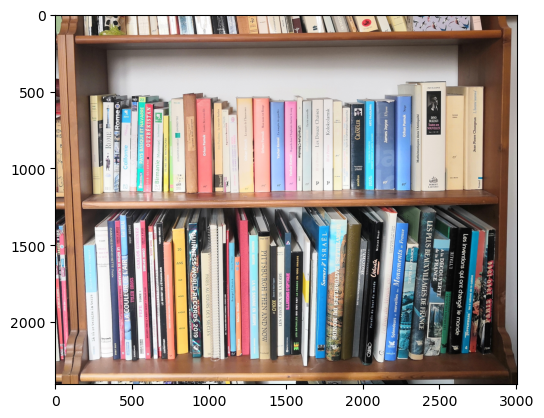

In [25]:
imrgb = skio.imread('books2.jpg')
plt.imshow(imrgb)
plt.show()

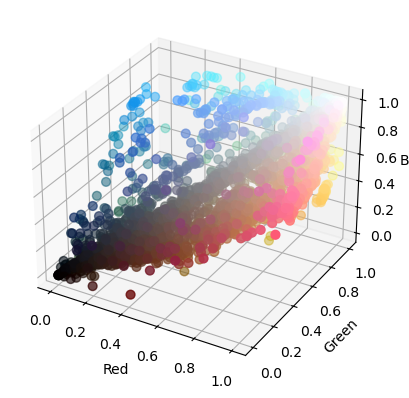

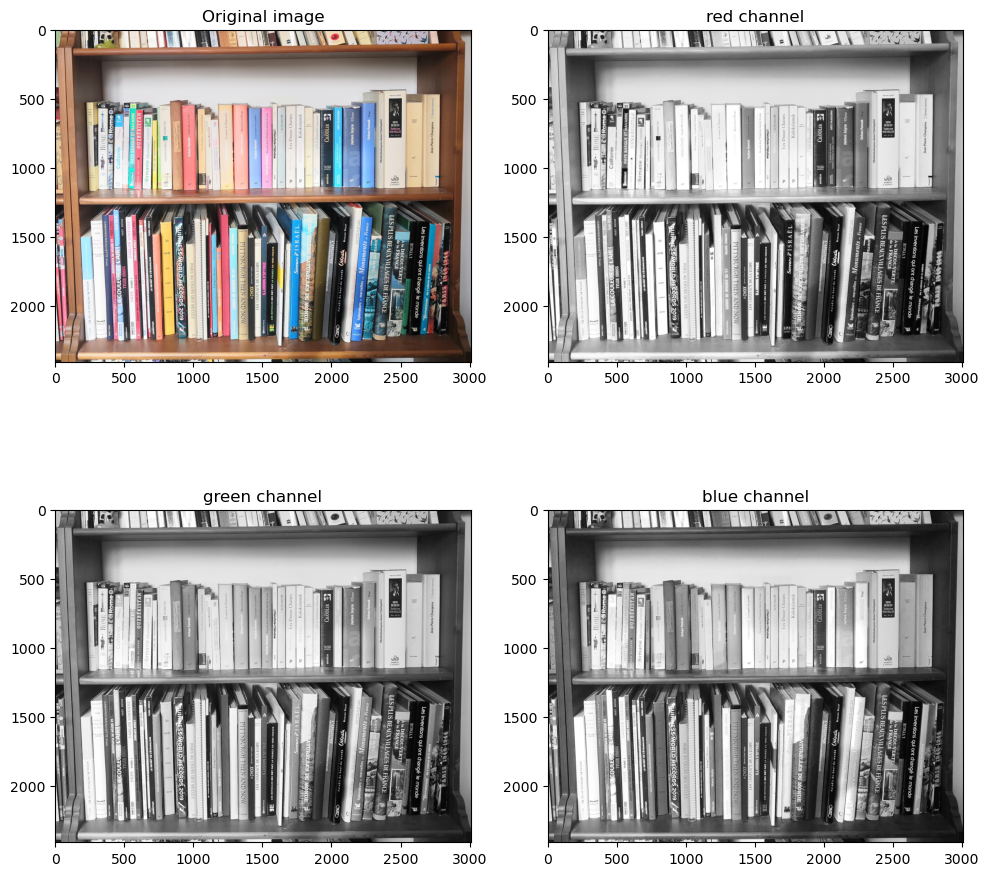

In [26]:
imred = imrgb[:, :, 0] / 255.0
imgreen = imrgb[:, :, 1] / 255.0
imblue = imrgb[:, :, 2] / 255.0
colordistrib(imrgb)

#image size
[nrow,ncol,nch] = imrgb.shape
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

#we display the images
axes[0, 0].imshow(imrgb)
axes[0,0].set_title('Original image')
axes[0, 1].imshow(imred, cmap="gray")
axes[0,1].set_title('red channel')
axes[1, 0].imshow(imgreen, cmap="gray")
axes[1,0].set_title('green channel')
axes[1, 1].imshow(imblue, cmap="gray")
axes[1,1].set_title('blue channel')
fig.tight_layout()

NameError: name 'img_eq' is not defined

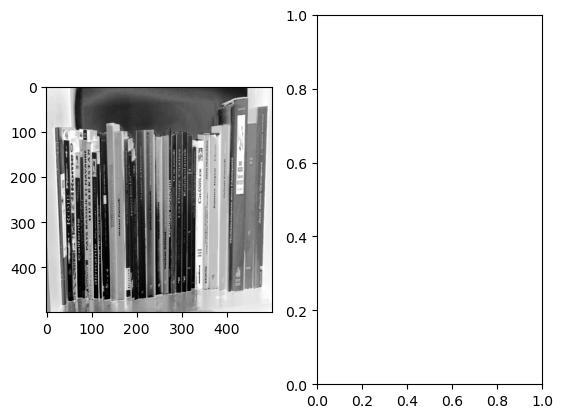

In [27]:
img = skio.imread('books9.jpg')
img = gamma_transformation(img, 1/2.2)
img = rgb2gray(img)

img = resize(
    img, (500, 500), anti_aliasing=True
)

img = equalize_histogram(img)

plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.subplot(1, 2, 2)
plt.imshow(img_eq, cmap='gray')
plt.show()

In [ ]:
img.shape

## Experimentation

### Morphology - book cluster approach

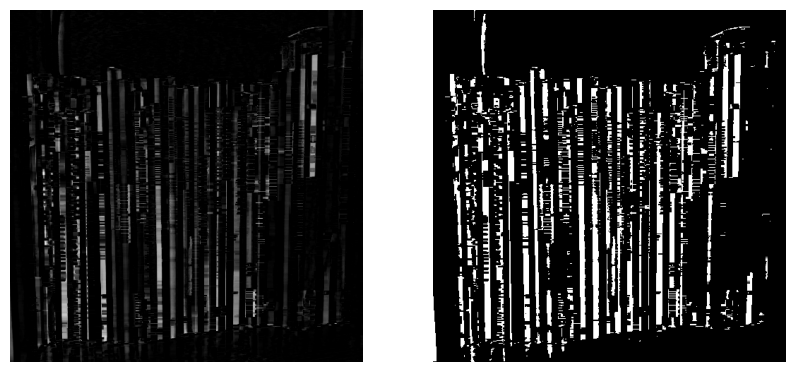

In [28]:
from skimage import feature
strell = line_strell((2, 10), 'v')
strell_h = line_strell((1, 10), 'h')
morpho_grad = morpho.dilation(img, strell) - morpho.erosion(img, strell)
morpho_grad = morpho.closing(morpho_grad, strell) - morpho_grad

thresh = threshold_otsu(morpho_grad)
binary = morpho_grad > 25

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.imshow(morpho_grad,cmap = "gray")
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(binary,cmap = "gray")
plt.axis('off')
plt.show()

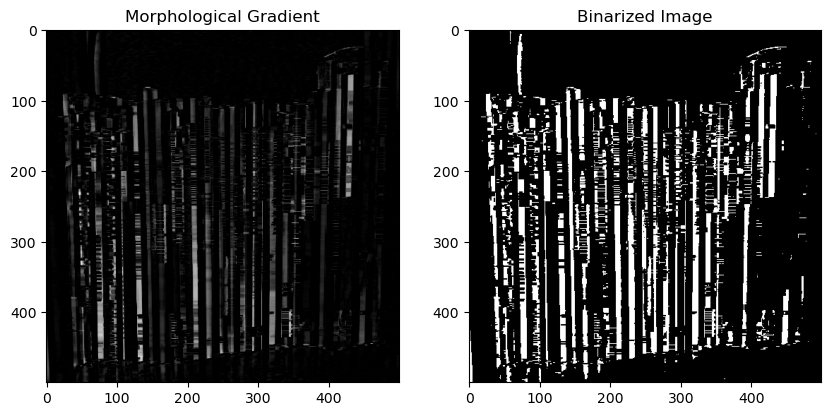

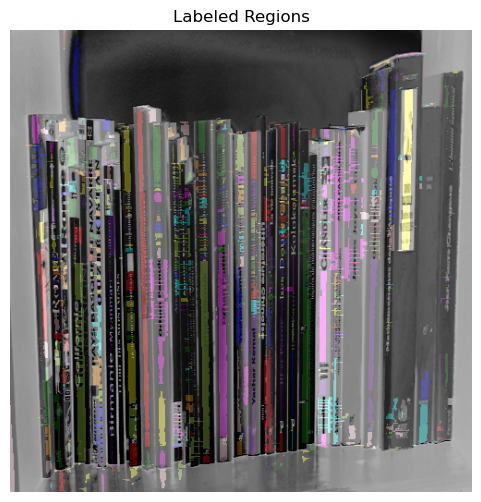

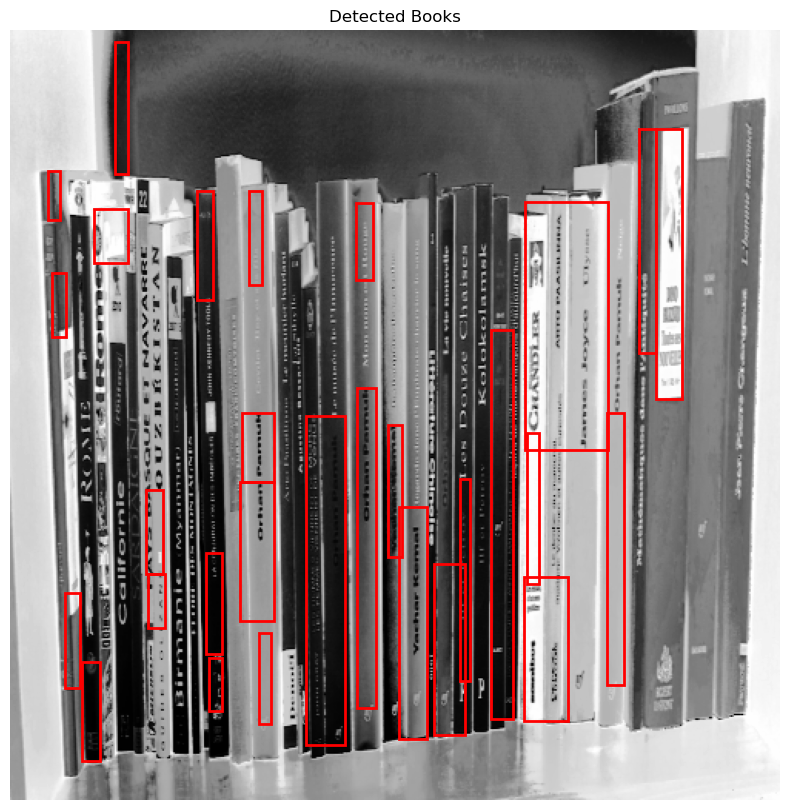

In [29]:
# Step 1: Thresholding
thresh = threshold_otsu(morpho_grad)
binary = morpho_grad > 20

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Morphological Gradient")
plt.imshow(morpho_grad, cmap="gray")
plt.subplot(1, 2, 2)
plt.title("Binarized Image")
plt.imshow(binary, cmap="gray")
plt.show()

# Step 2: Label connected regions
labeled_image = label(binary)
plt.figure(figsize=(6, 6))
plt.title("Labeled Regions")
plt.imshow(label2rgb(labeled_image, image=img, bg_label=0))
plt.axis("off")
plt.show()

# Step 3: Extract region properties
regions = regionprops(labeled_image)

bounding_boxes = []

for region in regions:
    # Filter regions based on size and aspect ratio
    min_area = 200         # Minimum area to be considered a book
    min_aspect_ratio = 0.5  # Minimum aspect ratio for a book
    max_aspect_ratio = 5.0  # Maximum aspect ratio for a book
    
    if region.area >= min_area:
        aspect_ratio = region.bbox[3] / (region.bbox[2] - region.bbox[0])
        if min_aspect_ratio < aspect_ratio < max_aspect_ratio:
            bounding_boxes.append(region.bbox)  # Append valid bounding boxes

# Step 4: Visualize bounding boxes on original image
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(img, cmap="gray")
ax.set_title("Detected Books")
ax.axis("off")

for bbox in bounding_boxes:
    # Draw rectangles around detected books
    min_row, min_col, max_row, max_col = bbox
    rect = plt.Rectangle((min_col, min_row), max_col - min_col, max_row - min_row,
                          edgecolor="red", linewidth=2, fill=False)
    ax.add_patch(rect)

plt.show()

(85, 1, 467, 499) 190236


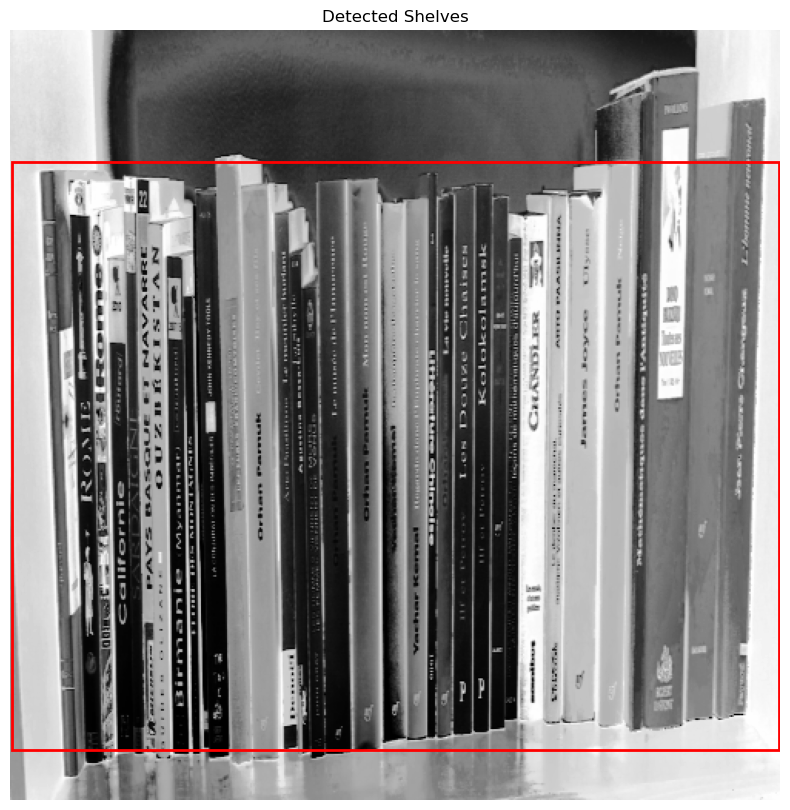

In [30]:
# Extracting bounding boxes from labeled regions
def extract_bounding_boxes(regions):
    bounding_boxes = []
    for region in regions:
        if region.area > 80:  # Ignore tiny regions
            bounding_boxes.append(region.bbox)
    return np.array(bounding_boxes)

# Clustering bounding boxes by y-position (vertical proximity)
def group_books_by_shelves(bounding_boxes, eps=10):
    y_centers = [(box[0] + box[2]) / 2 for box in bounding_boxes]
    y_centers = np.array(y_centers).reshape(-1, 1)

    # Use DBSCAN clustering to group by vertical proximity
    clustering = DBSCAN(eps=eps, min_samples=1).fit(y_centers)
    labels = clustering.labels_

    grouped_boxes = []
    for label in np.unique(labels):
        group = bounding_boxes[labels == label]
        grouped_boxes.append(group)

    return grouped_boxes

# Combine bounding boxes horizontally to form shelf-level boxes
def merge_bounding_boxes(boxes):
    x_min = min(box[1] for box in boxes)
    x_max = max(box[3] for box in boxes)
    y_min = min(box[0] for box in boxes)
    y_max = max(box[2] for box in boxes)
    return (y_min, x_min, y_max, x_max)

def merge_stacked_bboxes(bboxes, vertical_gap_threshold=0.05, width_similarity_threshold=0.10):
    """
    Merges bounding boxes stacked vertically if their vertical gap is small
    and their widths are similar.

    Args:
        bboxes (list of tuples): List of bounding boxes [(y_min, x_min, y_max, x_max), ...].
        vertical_gap_threshold (float): Threshold for the vertical gap as a percentage of box height.
        width_similarity_threshold (float): Threshold for width similarity as a percentage of box width.

    Returns:
        list of tuples: Updated list of bounding boxes after merging.
    """
    bboxes = sorted(bboxes, key=lambda box: box[0])  # Sort by y_min
    merged_bboxes = []

    skip = [False] * len(bboxes)  # Track boxes already merged

    for i in range(len(bboxes)):
        if skip[i]:
            continue  # Skip if already merged

        y_min1, x_min1, y_max1, x_max1 = bboxes[i]
        width1 = x_max1 - x_min1
        height1 = y_max1 - y_min1

        merged = False

        for j in range(i + 1, len(bboxes)):
            if skip[j]:
                continue  # Skip if already merged

            y_min2, x_min2, y_max2, x_max2 = bboxes[j]
            width2 = x_max2 - x_min2
            height2 = y_max2 - y_min2

            # Calculate vertical gap and width difference
            vertical_gap = max(y_min2 - y_max1, 0)  # Distance between box i's bottom and box j's top
            avg_height = (height1 + height2) / 2
            width_diff = abs(width1 - width2) / max(width1, width2)

            # Merge conditions
            if (
                vertical_gap <= vertical_gap_threshold * avg_height
                and width_diff <= width_similarity_threshold
            ):
                # Merge the boxes: choose the larger coordinates
                y_min_merged = min(y_min1, y_min2)
                x_min_merged = min(x_min1, x_min2)
                y_max_merged = max(y_max1, y_max2)
                x_max_merged = max(x_max1, x_max2)

                # Update the first box and mark the second as merged
                bboxes[i] = (y_min_merged, x_min_merged, y_max_merged, x_max_merged)
                skip[j] = True
                merged = True
                break

        # If no merge occurred, add the current box to the result
        if not merged:
            merged_bboxes.append(bboxes[i])

    # Add remaining boxes not skipped
    for i in range(len(bboxes)):
        if not skip[i]:
            merged_bboxes.append(bboxes[i])

    return merged_bboxes

# Visualizing grouped shelves
def visualize_shelves(image, shelves):
    plt.figure(figsize=(10, 10))
    plt.imshow(image, cmap='gray')
    for shelf in shelves:
        y_min, x_min, y_max, x_max = shelf
        plt.gca().add_patch(plt.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, 
                                          edgecolor='red', facecolor='none', linewidth=2))
    plt.title("Detected Shelves")
    plt.axis('off')
    plt.show()

def shelf_area(shelf):
    y_min, x_min, y_max, x_max = shelf
    area = (y_max - y_min) * (x_max - x_min)
    return area

def overlap_area_filter(shelves):
    def overlap_area(box1, box2):
        """Calculate the overlapping area between two bounding boxes."""
        y_min1, x_min1, y_max1, x_max1 = box1
        y_min2, x_min2, y_max2, x_max2 = box2

        # Calculate overlap dimensions
        y_overlap = max(0, min(y_max1, y_max2) - max(y_min1, y_min2))
        x_overlap = max(0, min(x_max1, x_max2) - max(x_min1, x_min2))

        return y_overlap * x_overlap

    def has_significant_overlap(box1, box2):
        """Check if the overlap between two boxes is more than 50% of the smaller box."""
        area1 = shelf_area(box1)
        area2 = shelf_area(box2)
        overlap = overlap_area(box1, box2)
        return overlap / min(area1, area2) > 0.5

    # Sort shelves by area in descending order
    shelves_sorted = sorted(shelves, key=shelf_area, reverse=True)
    filtered_shelves = []

    for shelf in shelves_sorted:
        # Add shelf if it doesn't overlap significantly with any already selected
        if all(not has_significant_overlap(shelf, filtered_shelf) for filtered_shelf in filtered_shelves):
            filtered_shelves.append(shelf)

    return filtered_shelves

def shelf_area_filter(shelves):
    shelf_areas = [shelf_area(shelf) for shelf in shelves]
    max_area = max(shelf_areas)
    boundary = 0.5 * max_area
    shelves_filtered = [shelf for shelf in shelves if shelf_area(shelf) > boundary]
    return shelves_filtered

def extend_shelf(shelf):
    y_min, x_min, y_max, x_max = shelf
    if x_max < 499:
        x_max = 499
    if x_min > 1:
        x_min = 1
    return (y_min, x_min, y_max, x_max)

# Apply functions to detect shelves
regions = regionprops(label(binary))
bounding_boxes = extract_bounding_boxes(regions)
grouped_boxes = group_books_by_shelves(bounding_boxes)

# Merge bounding boxes within each shelf group
shelves = [merge_bounding_boxes(group) for group in grouped_boxes]
shelves = merge_stacked_bboxes(shelves)
shelves = [extend_shelf(shelf) for shelf in shelf_area_filter(shelves)]
shelves = [extend_shelf(shelf) for shelf in overlap_area_filter(shelves)]

for shelf in shelves:
    print(shelf, shelf_area(shelf))

# Visualize the detected shelves
visualize_shelves(img, shelves)

### Colorimetry approach

In [31]:
def visualize_hsv_channels(image):
    """
    Visualizes the individual channels of the HSV space.

    Args:
        image (numpy.ndarray): Original RGB image.
    """
    # Convert image to HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    # Split HSV into channels
    hue, saturation, value = cv2.split(hsv_image)

    # Plot each channel
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 4, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.imshow(hue, cmap="hsv")
    plt.title("Hue Channel")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(saturation, cmap="gray")
    plt.title("Saturation Channel")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.imshow(value, cmap="gray")
    plt.title("Value Channel")
    plt.axis("off")

    plt.show()

# Visualize HSV channels
visualize_hsv_channels(image)

NameError: name 'image' is not defined

In [32]:
# Convert RGB to HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

# Extract specific channels
hue_channel = hsv_image[:, :, 0]
saturation_channel = hsv_image[:, :, 1]
value_channel = hsv_image[:, :, 2]

# Apply edge detection on the Saturation channel
edges = cv2.Canny(hue_channel, threshold1=50, threshold2=150)

# Visualize the edges
plt.imshow(edges, cmap='gray')
plt.title("Edges Detected in Saturation Channel")
plt.axis("off")
plt.show()

# Replace the Saturation channel with the processed result (e.g., edges)
processed_hsv = hsv_image.copy()
processed_hsv[:, :, 1] = cv2.bitwise_and(hue_channel, edges)

# Convert back to RGB
processed_rgb = cv2.cvtColor(processed_hsv, cv2.COLOR_HSV2RGB)

# Visualize the result
plt.imshow(processed_rgb)
plt.title("Processed RGB with Modified Saturation")
plt.axis("off")
plt.show()

NameError: name 'image' is not defined

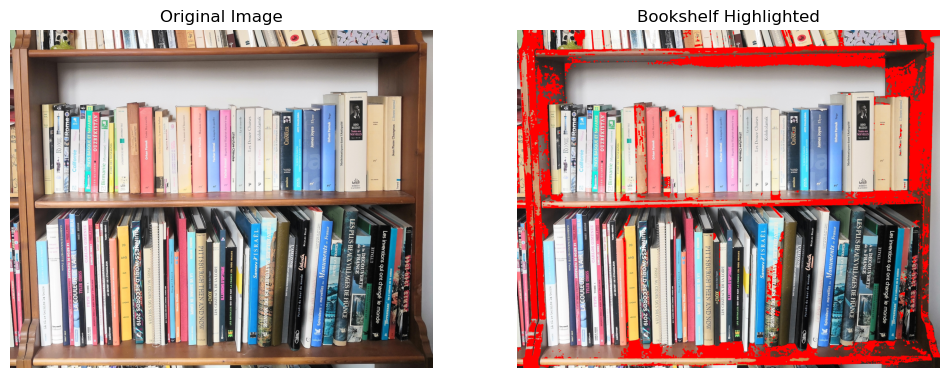

In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def filter_bookshelf(image):
    """
    Filters out the bookshelf (furniture) based on its consistent color.
    
    Args:
        image (numpy.ndarray): Input image in RGB format.
    
    Returns:
        numpy.ndarray: Binary mask highlighting the bookshelf.
    """
    # Convert image to HSV color space
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    
    # Define color range for the bookshelf
    lower_color = np.array([10, 50, 50])
    upper_color = np.array([15, 255, 200])
    
    # Create a binary mask for the bookshelf color
    mask = cv2.inRange(hsv_image, lower_color, upper_color)
    
    # Apply morphological operations to clean up the mask
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    
    return mask

def visualize_bookshelf(image, mask):
    """
    Visualizes the original image with the bookshelf highlighted.
    
    Args:
        image (numpy.ndarray): Original image in RGB format.
        mask (numpy.ndarray): Binary mask highlighting the bookshelf.
    """
    # Overlay mask on the original image
    highlighted = image.copy()
    highlighted[mask > 0] = [255, 0, 0]
    
    # Plot original image and highlighted bookshelf
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    plt.imshow(highlighted)
    plt.title("Bookshelf Highlighted")
    plt.axis("off")
    plt.show()

# Load image
image_path = "books2.jpg"
image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)

# Filter bookshelf
bookshelf_mask = filter_bookshelf(image)

# Visualize results
visualize_bookshelf(image, bookshelf_mask)

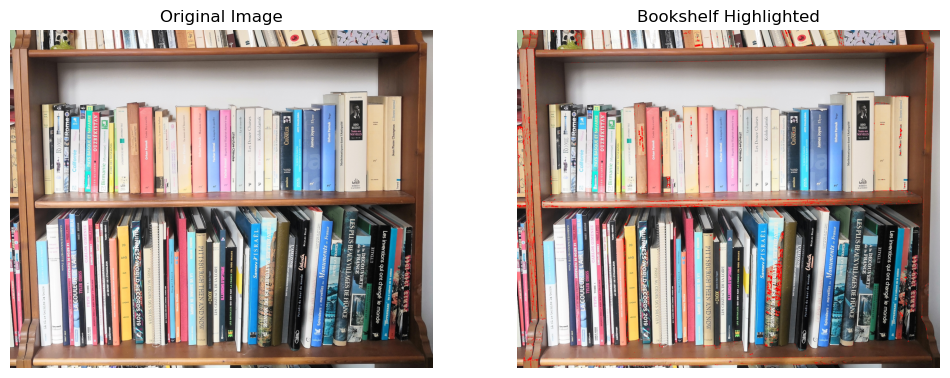

In [34]:
def refine_with_edges(image, mask):
    """
    Refines the bookshelf mask by adding edge detection.

    Args:
        image (numpy.ndarray): Original RGB image.
        mask (numpy.ndarray): Binary mask highlighting the bookshelf.
    
    Returns:
        numpy.ndarray: Refined mask with edges integrated.
    """
    # Convert the original image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Apply Canny edge detection
    edges = cv2.Canny(gray_image, threshold1=50, threshold2=150)

    # Combine edges with the color mask
    refined_mask = cv2.bitwise_and(mask, edges)

    # Optionally, apply morphological operations to smooth the mask
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    refined_mask = cv2.morphologyEx(refined_mask, cv2.MORPH_CLOSE, kernel)

    return refined_mask

# Apply edge-based refinement
refined_mask = refine_with_edges(image, bookshelf_mask)

# Visualize refined mask
visualize_bookshelf(image, refined_mask)

## Final functions

In [35]:
def preprocess(img):
    """
    Preprocesses the input image by converting it to grayscale, resizing it, 
    and applying histogram equalization.

    Args:
        img (numpy.ndarray): The input RGB image.

    Returns:
        numpy.ndarray: The preprocessed grayscale image.
    """
    img_resized = resize(
        img, (500, 500), anti_aliasing=True
    )
    img_gamma = gamma_transformation(img_resized, 1/5)
    img_gray = rgb2gray(img_gamma)
    img_eq = equalize_histogram(img_gray)
    return img_eq

def extract_bounding_boxes(regions):
    """
    Extracts bounding boxes from a list of region properties.

    Args:
        regions (list): A list of region properties obtained from the labeled image.

    Returns:
        numpy.ndarray: An array of bounding boxes. Each bounding box is represented 
        as (y_min, x_min, y_max, x_max).
    """
    bounding_boxes = []
    for region in regions:
        if region.area > 80:
            bounding_boxes.append(region.bbox)
    return np.array(bounding_boxes)


def group_books_by_shelves(bounding_boxes, eps=10):
    """
    Groups bounding boxes into shelves based on their vertical proximity using DBSCAN clustering.

    Args:
        bounding_boxes (numpy.ndarray): An array of bounding boxes. Each bounding box is 
        represented as (y_min, x_min, y_max, x_max).
        eps (int, optional): The maximum distance between points in a cluster. Defaults to 30.

    Returns:
        list: A list of grouped bounding boxes. Each group corresponds to a detected shelf.
    """
    y_centers = [(box[0] + box[2]) / 2 for box in bounding_boxes]
    y_centers = np.array(y_centers).reshape(-1, 1)

    # Use DBSCAN clustering to group by vertical proximity
    clustering = DBSCAN(eps=eps, min_samples=1).fit(y_centers)
    labels = clustering.labels_

    grouped_boxes = []
    for label in np.unique(labels):
        group = bounding_boxes[labels == label]
        grouped_boxes.append(group)

    return grouped_boxes


def merge_bounding_boxes(boxes):
    """
    Merges a list of bounding boxes into a single bounding box that encompasses them all.

    Args:
        boxes (list): A list of bounding boxes. Each bounding box is represented as 
        (y_min, x_min, y_max, x_max).

    Returns:
        tuple: A single bounding box represented as (y_min, x_min, y_max, x_max).
    """
    x_min = min(box[1] for box in boxes)
    x_max = max(box[3] for box in boxes)
    y_min = min(box[0] for box in boxes)
    y_max = max(box[2] for box in boxes)
    return (y_min, x_min, y_max, x_max)

def merge_stacked_bboxes(bboxes, vertical_gap_threshold=0.05, width_similarity_threshold=0.10):
    """
    Merges bounding boxes stacked vertically if their vertical gap is small
    and their widths are similar.

    Args:
        bboxes (list of tuples): List of bounding boxes [(y_min, x_min, y_max, x_max), ...].
        vertical_gap_threshold (float): Threshold for the vertical gap as a percentage of box height.
        width_similarity_threshold (float): Threshold for width similarity as a percentage of box width.

    Returns:
        list of tuples: Updated list of bounding boxes after merging.
    """
    bboxes = sorted(bboxes, key=lambda box: box[0])  # Sort by y_min
    merged_bboxes = []

    skip = [False] * len(bboxes)  # Track boxes already merged

    for i in range(len(bboxes)):
        if skip[i]:
            continue  # Skip if already merged

        y_min1, x_min1, y_max1, x_max1 = bboxes[i]
        width1 = x_max1 - x_min1
        height1 = y_max1 - y_min1

        merged = False

        for j in range(i + 1, len(bboxes)):
            if skip[j]:
                continue  # Skip if already merged

            y_min2, x_min2, y_max2, x_max2 = bboxes[j]
            width2 = x_max2 - x_min2
            height2 = y_max2 - y_min2

            # Calculate vertical gap and width difference
            vertical_gap = max(y_min2 - y_max1, 0)  # Distance between box i's bottom and box j's top
            avg_height = (height1 + height2) / 2
            width_diff = abs(width1 - width2) / max(width1, width2)

            # Merge conditions
            if (
                vertical_gap <= vertical_gap_threshold * avg_height
                and width_diff <= width_similarity_threshold
            ):
                # Merge the boxes: choose the larger coordinates
                y_min_merged = min(y_min1, y_min2)
                x_min_merged = min(x_min1, x_min2)
                y_max_merged = max(y_max1, y_max2)
                x_max_merged = max(x_max1, x_max2)

                # Update the first box and mark the second as merged
                bboxes[i] = (y_min_merged, x_min_merged, y_max_merged, x_max_merged)
                skip[j] = True
                merged = True
                break

        # If no merge occurred, add the current box to the result
        if not merged:
            merged_bboxes.append(bboxes[i])

    # Add remaining boxes not skipped
    for i in range(len(bboxes)):
        if not skip[i]:
            merged_bboxes.append(bboxes[i])

    return merged_bboxes

def visualize_shelves(image, shelves):
    """
    Visualizes detected shelves on the given image by drawing bounding boxes.

    Args:
        image (numpy.ndarray): The grayscale input image.
        shelves (list): A list of bounding boxes for the shelves. Each bounding box is 
        represented as (y_min, x_min, y_max, x_max).

    Returns:
        None
    """
    plt.figure(figsize=(10, 10))
    plt.imshow(image, cmap='gray')
    for shelf in shelves:
        y_min, x_min, y_max, x_max = shelf
        plt.gca().add_patch(plt.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, 
                                          edgecolor='red', facecolor='none', linewidth=2))
    plt.title("Detected Shelves")
    plt.axis('off')
    plt.show()


def shelf_area(shelf):
    """
    Calculates the area of a shelf bounding box.

    Args:
        shelf (tuple): A bounding box represented as (y_min, x_min, y_max, x_max).

    Returns:
        int: The area of the bounding box.
    """
    y_min, x_min, y_max, x_max = shelf
    area = (y_max - y_min) * (x_max - x_min)
    return area

def shelf_area_filter(shelves):
    shelf_areas = [shelf_area(shelf) for shelf in shelves]
    max_area = max(shelf_areas)
    boundary = 0.5 * max_area
    shelves_filtered = [shelf for shelf in shelves if shelf_area(shelf) > boundary]
    return shelves_filtered

def overlap_area_filter(shelves):
    def overlap_area(box1, box2):
        """Calculate the overlapping area between two bounding boxes."""
        y_min1, x_min1, y_max1, x_max1 = box1
        y_min2, x_min2, y_max2, x_max2 = box2

        # Calculate overlap dimensions
        y_overlap = max(0, min(y_max1, y_max2) - max(y_min1, y_min2))
        x_overlap = max(0, min(x_max1, x_max2) - max(x_min1, x_min2))

        return y_overlap * x_overlap

    def has_significant_overlap(box1, box2):
        """Check if the overlap between two boxes is more than 50% of the smaller box."""
        area1 = shelf_area(box1)
        area2 = shelf_area(box2)
        overlap = overlap_area(box1, box2)
        return overlap / min(area1, area2) > 0.3

    # Sort shelves by area in descending order
    shelves_sorted = sorted(shelves, key=shelf_area, reverse=True)
    filtered_shelves = []

    for shelf in shelves_sorted:
        # Add shelf if it doesn't overlap significantly with any already selected
        if all(not has_significant_overlap(shelf, filtered_shelf) for filtered_shelf in filtered_shelves):
            filtered_shelves.append(shelf)

    return filtered_shelves

def extend_shelf(shelf):
    """
    Extends the width of a shelf bounding box to the image boundary if needed.

    Args:
        shelf (tuple): A bounding box represented as (y_min, x_min, y_max, x_max).

    Returns:
        tuple: The extended bounding box.
    """
    y_min, x_min, y_max, x_max = shelf
    if x_max < 499:
        x_max = 499
    if x_min > 1:
        x_min = 1
    return (y_min, x_min, y_max, x_max)

def find_shelves(img):
    """
    Detects bookshelves in an image by preprocessing the image, 
    applying morphological operations, and finding shelf bounding boxes.

    Args:
        img (numpy.ndarray): The input RGB image.

    Returns:
        list: A list of bounding boxes for the detected shelves. Each bounding 
        box is represented as [y_min, x_min, y_max, x_max].
    """
    # Step 0: Pre-processing
    img = preprocess(img)

    # Step 1: Apply morphological gradient
    strell = line_strell((2, 10), 'v')
    morpho_grad = morpho.dilation(img, strell) - morpho.erosion(img, strell)
    morpho_grad = morpho.closing(morpho_grad, strell) - morpho_grad
    
    # Step 2: Thresholding with Otsu's method
    thresh = threshold_otsu(morpho_grad)
    binary = morpho_grad > 20
    
    # Step 3: Label connected regions
    labeled_image = label(binary)

    # Step 4: Find region props
    regions = regionprops(label(binary))

    # Step 5: Find and group bounding boxes
    bounding_boxes = extract_bounding_boxes(regions)
    grouped_boxes = group_books_by_shelves(bounding_boxes)
    
    # Step 6: Merge bounding boxes within each shelf group
    shelves = [merge_bounding_boxes(group) for group in grouped_boxes]
    shelves = merge_stacked_bboxes(shelves, vertical_gap_threshold=0.01)

    # Step 7: Filter and post-process the shelves
    shelves = [extend_shelf(shelf) for shelf in shelf_area_filter(shelves)]
    shelves = [extend_shelf(shelf) for shelf in overlap_area_filter(shelves)]
    
    return shelves


def scale_back(img, shelves):
    """
    Scales bounding boxes back to the original image size after resizing.

    Args:
        img (numpy.ndarray): The original RGB image.
        shelves (list): A list of bounding boxes in the resized image. Each bounding 
        box is represented as [y_min, x_min, y_max, x_max].

    Returns:
        numpy.ndarray: The bounding boxes scaled to the original image size.
    """
    original_height, original_width, _ = img.shape
    resized_height, resized_width = 500, 500
   
    bounding_boxes_resized = shelves
    
    scale_y = original_height / resized_height
    scale_x = original_width / resized_width
    
    bounding_boxes_original = []
    for bbox in bounding_boxes_resized:
        y_min, x_min, y_max, x_max = bbox
        y_min = int(y_min * scale_y)
        x_min = int(x_min * scale_x)
        y_max = int(y_max * scale_y)
        x_max = int(x_max * scale_x)
        bounding_boxes_original.append([y_min, x_min, y_max, x_max])
    
    bounding_boxes_original = np.array(bounding_boxes_original)
    return bounding_boxes_original


def get_shelves(img, shelves, scale=True):
    """
    Extracts the cropped images of the detected shelves from the input image.

    Args:
        img (numpy.ndarray): The original RGB image.
        shelves (list): A list of bounding boxes for the shelves. Each bounding 
        box is represented as [y_min, x_min, y_max, x_max].
        scale (bool, optional): Whether to scale the bounding boxes back to the 
        original image size. Defaults to True.

    Returns:
        list: A list of cropped images of the shelves.
    """
    if scale:
        shelves = scale_back(img, shelves)
    shelf_images = []
    for shelf in shelves:
        y_min, x_min, y_max, x_max = shelf
        cropped_image = img[y_min:y_max, x_min:x_max]
        shelf_images.append(cropped_image)
    return shelf_images


def visualize_shelves_rgb(img, shelves):
    """
    Visualizes the detected shelves on the original RGB image by drawing bounding boxes.

    Args:
        img (numpy.ndarray): The original RGB image.
        shelves (list): A list of bounding boxes for the shelves. Each bounding 
        box is represented as [y_min, x_min, y_max, x_max].

    Returns:
        None
    """
    shelves = scale_back(img, shelves)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    for shelf in shelves:
        y_min, x_min, y_max, x_max = shelf
        plt.gca().add_patch(plt.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, 
                                          edgecolor='red', facecolor='none', linewidth=2))
    plt.title("Detected Shelves")
    plt.axis('off')
    plt.show()

## Testing

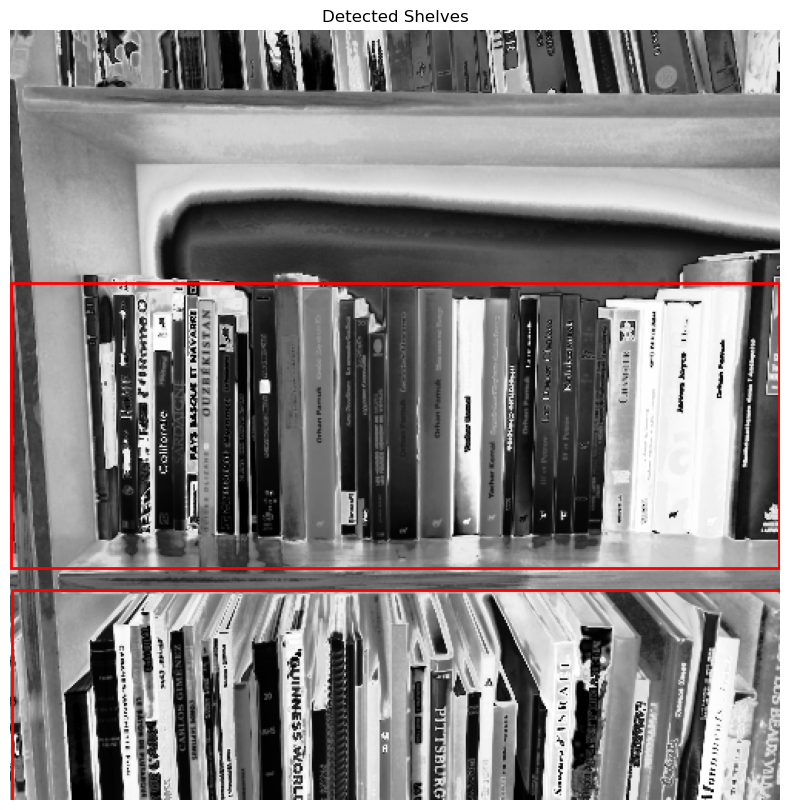

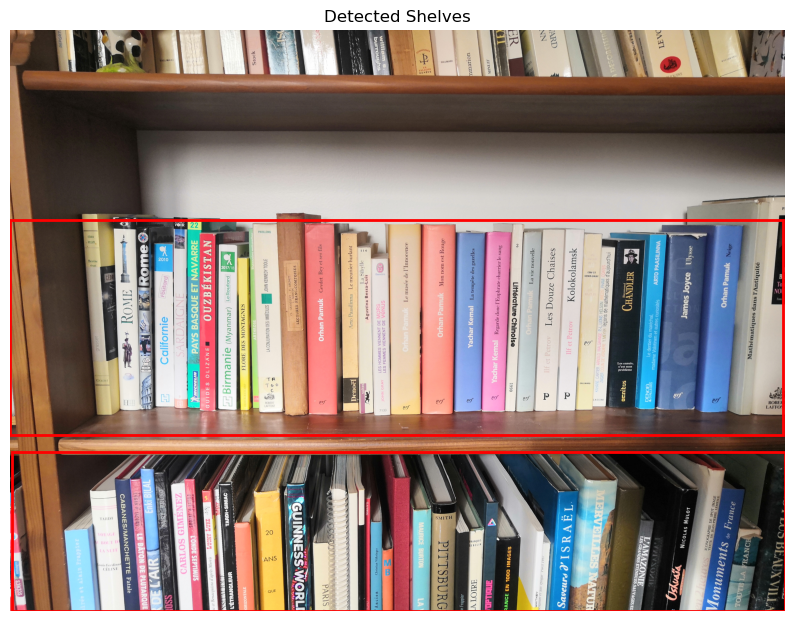

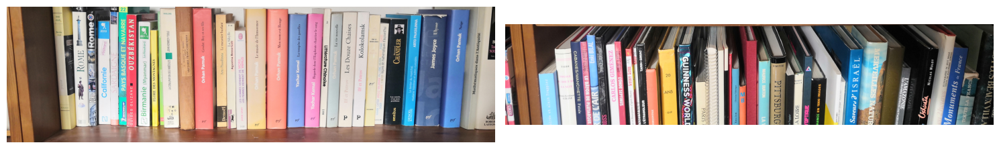

In [36]:
import skimage.io as skio
img = skio.imread('books6.jpg')
shelves = find_shelves(img)
img_pre = preprocess(img)
visualize_shelves(img_pre, shelves)
visualize_shelves_rgb(img, shelves)
shelf_images = get_shelves(img, shelves)
show_images(shelf_images)

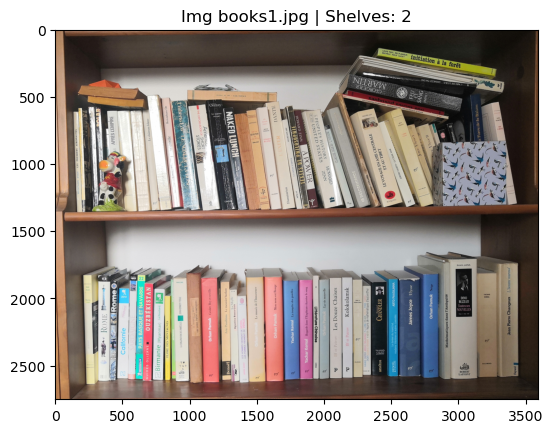

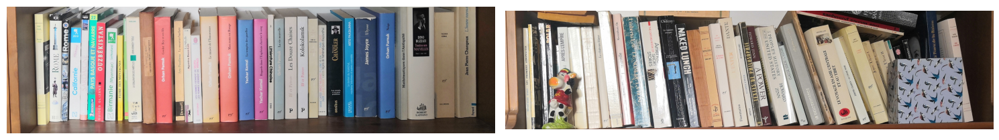

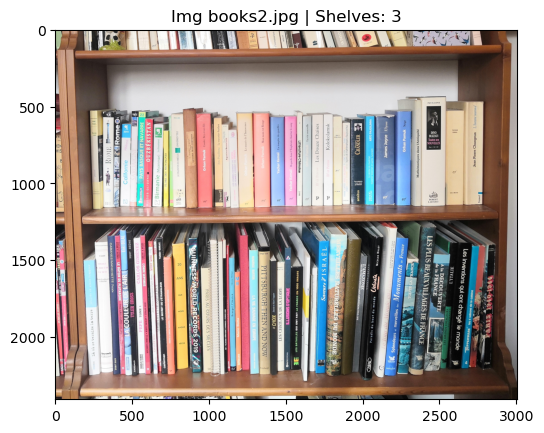

AttributeError: 'numpy.ndarray' object has no attribute 'imshow'

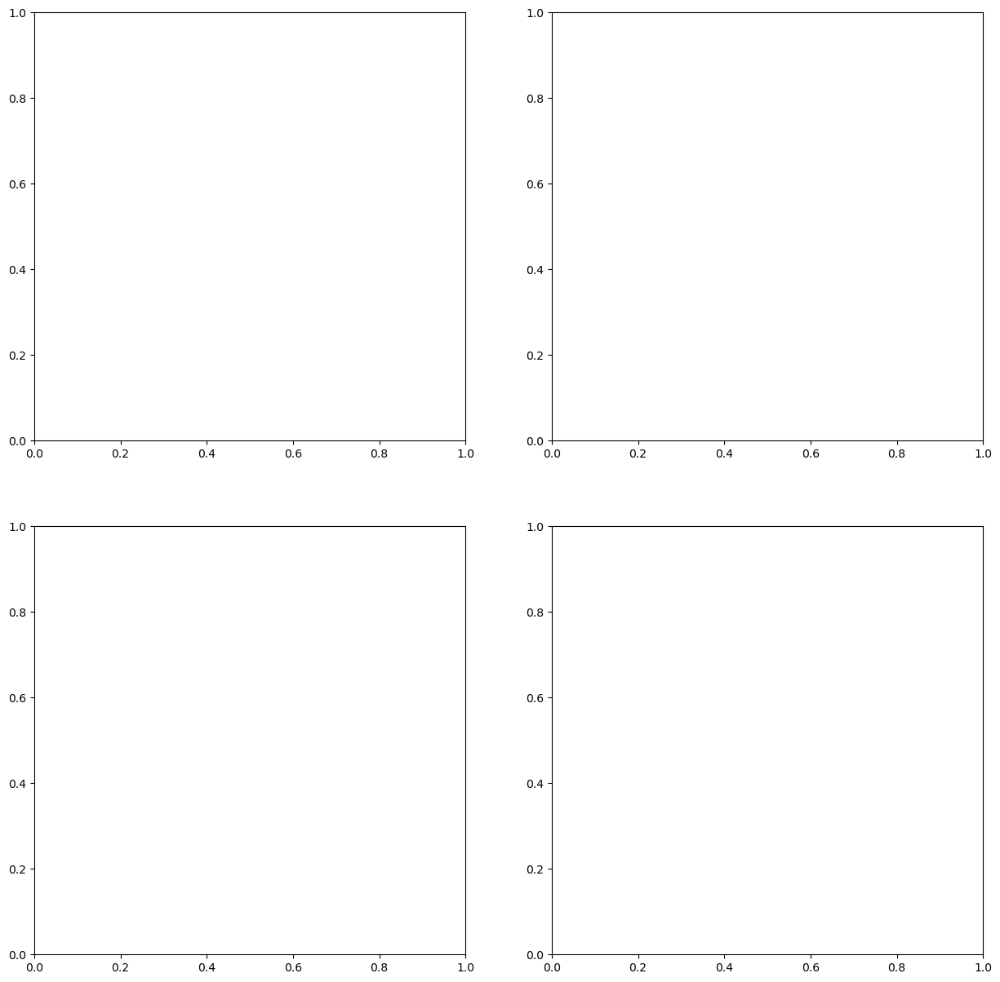

In [37]:
import skimage.io as skio
import matplotlib.pyplot as plt
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as segmentation
import skimage
from skimage.transform import rescale, resize
from skimage.measure import label, regionprops, regionprops_table
from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops
from skimage.color import label2rgb
from sklearn.cluster import DBSCAN
from scipy.signal import find_peaks
from skimage.filters import sobel
img_paths = ['books1.jpg', 'books2.jpg', 'books6.jpg', 'books8.jpg', 'books9.jpg']
imgs = [skio.imread(path) for path in img_paths]
for i, new_img in enumerate(imgs):
    shelves = find_shelves(new_img)
    shelf_imgs = get_shelves(new_img, shelves)
    plt.figure()
    plt.imshow(new_img)
    plt.title(f"Img {img_paths[i]} | Shelves: {len(shelves)}")
    plt.show()
    show_images(shelf_imgs)

# Segmentation of books and titles extraction

Now that we have shelves segmented, we can start on extracting the singular books and (hopefully) titles.

In [ ]:
img_paths = ['books1.jpg', 'books2.jpg', 'books6.jpg', 'books8.jpg', 'books9.jpg']
imgs = [skio.imread(path) for path in img_paths]
all_shelves = []
for new_img in imgs:
    shelves = find_shelves(new_img)
    shelf_imgs = get_shelves(new_img, shelves)
    [all_shelves.append(shelf_img) for shelf_img in shelf_imgs]

In [38]:
img = all_shelves[0]

plt.imshow(img)
plt.show()

NameError: name 'all_shelves' is not defined

In [39]:
def preprocess_shelf_image(shelf_img):
    """
    Convert the shelf image to grayscale for further processing.
    
    Args:
        shelf_img (ndarray): Cropped shelf image.
        
    Returns:
        ndarray: Grayscale image.
    """
    if len(shelf_img.shape) == 3:
        gray = rgb2gray(shelf_img)
    else:
        gray = shelf_img
    return gray

def detect_edges(gray_img):
    """
    Detect vertical edges using Sobel filter.
    
    Args:
        gray_img (ndarray): Grayscale shelf image.
        
    Returns:
        ndarray: Image with detected edges.
    """
    edges = sobel(gray_img)
    return edges

def compute_vertical_projection(edges):
    """
    Compute the vertical projection by summing pixel intensities along the vertical axis.
    
    Args:
        edges (ndarray): Edge-detected image.
        
    Returns:
        ndarray: 1D projection of vertical intensity.
    """
    vertical_projection = np.sum(edges, axis=0)
    return vertical_projection

def find_book_peaks(vertical_projection, distance=20):
    """
    Find peaks in the vertical projection to detect book separations.
    
    Args:
        vertical_projection (ndarray): 1D projection of vertical intensity.
        distance (int): Minimum distance between peaks.
        
    Returns:
        ndarray: Indices of the peaks in the projection.
    """
    peaks, _ = find_peaks(vertical_projection, distance=distance)
    return peaks

def generate_bounding_boxes(peaks, image_height):
    """
    Generate bounding boxes for each book based on the detected peaks.
    
    Args:
        peaks (ndarray): Indices of the detected peaks.
        image_height (int): Height of the image.
        
    Returns:
        list of tuples: Bounding boxes for each book in (y_min, x_min, y_max, x_max) format.
    """
    book_boxes = []
    for i in range(len(peaks) - 1):
        x_min = peaks[i]
        x_max = peaks[i + 1]
        book_boxes.append((0, x_min, image_height, x_max))
    return book_boxes

def segment_books(shelf_img):
    """
    Segment books in a shelf using vertical edge detection and peak finding.
    
    Args:
        shelf_img (ndarray): Cropped shelf image.
        
    Returns:
        list of tuples: Bounding boxes of individual books.
    """
    # Step 1: Preprocess the image
    gray_img = preprocess_shelf_image(shelf_img)
    
    # Step 2: Detect edges
    edges = detect_edges(gray_img)
    
    # Step 3: Compute vertical projection
    vertical_projection = compute_vertical_projection(edges)
    
    # Step 4: Find peaks
    peaks = find_book_peaks(vertical_projection)
    
    # Step 5: Generate bounding boxes
    book_boxes = generate_bounding_boxes(peaks, gray_img.shape[0])
    
    return book_boxes

(-0.5, 4607.5, 3455.5, -0.5)

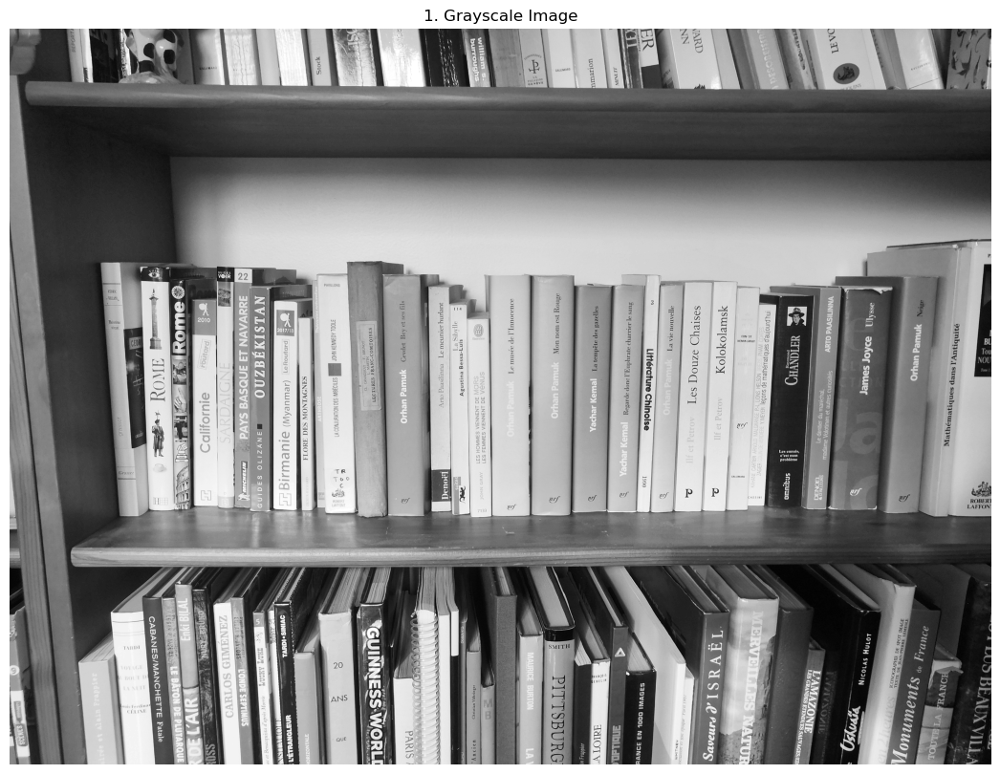

In [40]:
gray_img = preprocess_shelf_image(img)
plt.figure(figsize=(15, 10))
plt.imshow(gray_img, cmap='gray')
plt.title("1. Grayscale Image")
plt.axis('off')

(-0.5, 4607.5, 3455.5, -0.5)

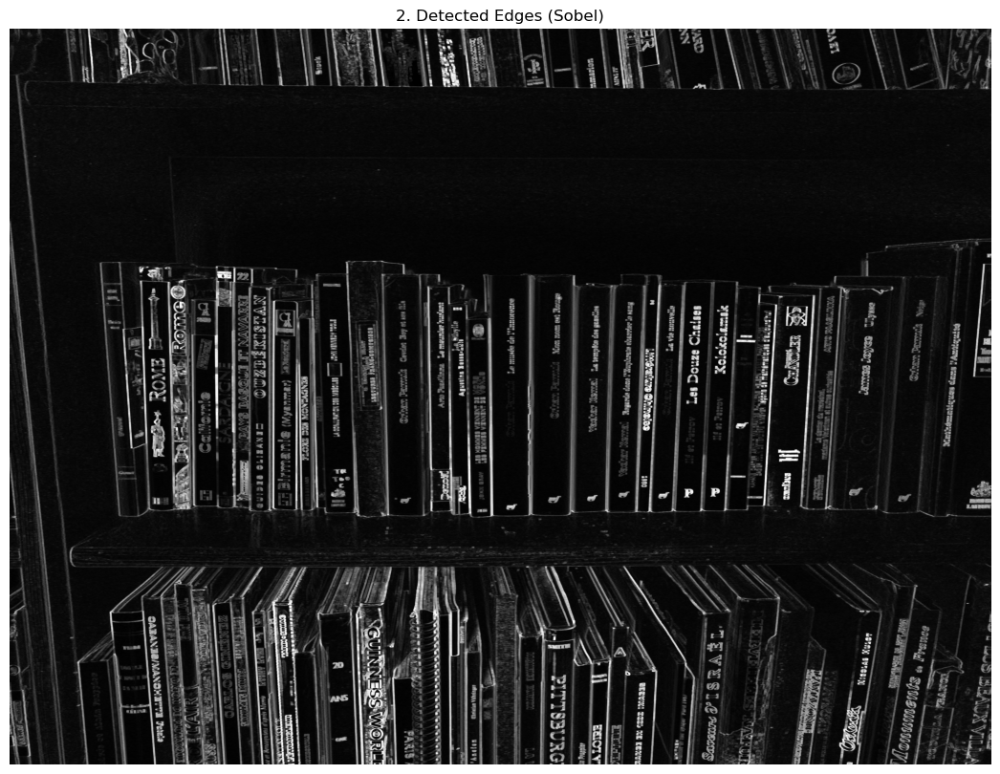

In [41]:
# Step 2: Detect edges
strell = line_strell((2, 10), mode='v')
edges = morpho.dilation(gray_img, strell) - morpho.erosion(gray_img, strell)
plt.figure(figsize=(15, 10))
plt.imshow(edges, cmap='gray')
plt.title("2. Detected Edges (Sobel)")
plt.axis('off')

In [42]:
def detect_books_with_rectangles(edges):
    """
    Detect rectangles (books) in the shelf image using edge detection and contour detection.
    
    Args:
        img (ndarray): The preprocessed grayscale shelf image.
    
    Returns:
        list: Bounding boxes for detected books.
    """
    # Step 2: Binary thresholding
    thresh = threshold_otsu(edges)
    binary = edges > thresh

    # Step 3: Morphological closing to fill gaps
    binary_closed = morpho.closing(binary, line_strell((20, 80), mode = 'h'))

    # Step 4: Label connected regions
    labeled_image = label(binary_closed)
    
    # Step 5: Extract region properties
    regions = regionprops(labeled_image)

    # Step 6: Filter and extract bounding boxes
    book_boxes = []
    for region in regions:
        # Consider only regions with a rectangular shape
        #if region.area > 200 and region.extent > 0.6:
            book_boxes.append(region.bbox)  # (y_min, x_min, y_max, x_max)
    
    return book_boxes, binary_closed, edges

In [ ]:
def visualize_rectangle_detection(img, book_boxes, edges, binary_closed):
    """
    Visualize the intermediate steps and the detected rectangles for books.
    """
    plt.figure(figsize=(15, 10))

    # Original grayscale image
    plt.subplot(2, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title("1. Original Grayscale")
    plt.axis('off')

    # Morphological edges
    plt.subplot(2, 3, 2)
    plt.imshow(edges, cmap='gray')
    plt.title("2. Morphological Gradient")
    plt.axis('off')

    # Binary image after thresholding
    plt.subplot(2, 3, 3)
    plt.imshow(binary_closed, cmap='gray')
    plt.title("3. Binary (Closed)")
    plt.axis('off')

    # Bounding boxes on the original image
    plt.subplot(2, 3, 4)
    plt.imshow(img, cmap='gray')
    for box in book_boxes:
        y_min, x_min, y_max, x_max = box
        plt.gca().add_patch(plt.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min,
                                          edgecolor='red', facecolor='none', linewidth=2))
    plt.title("4. Detected Books (Rectangles)")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

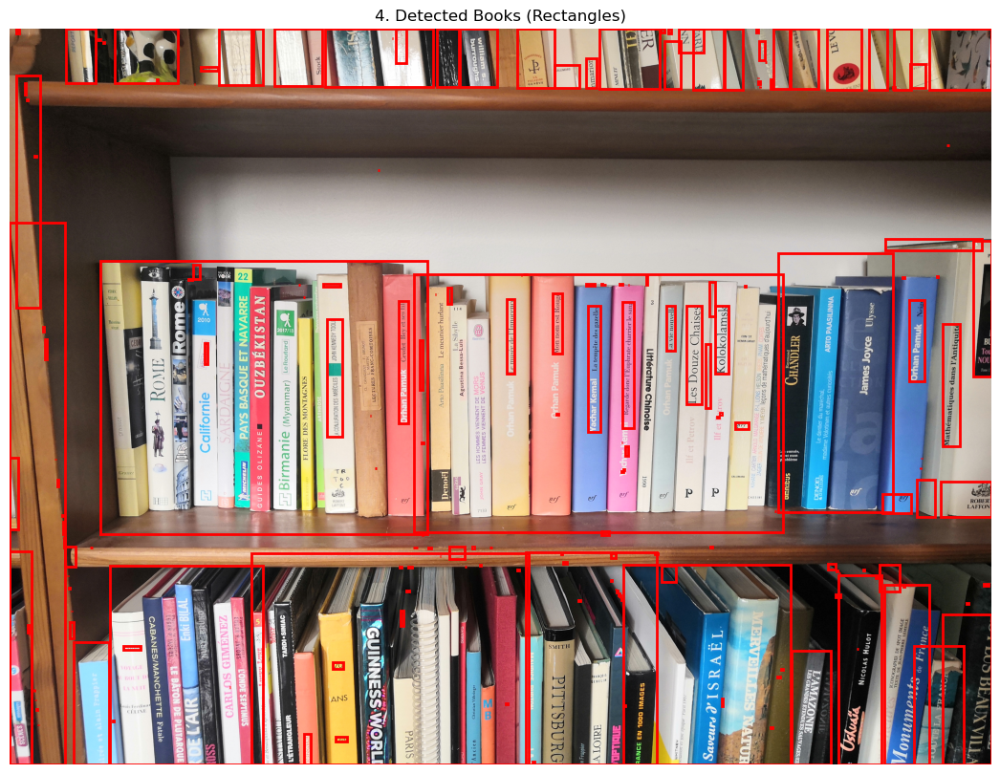

In [43]:
book_boxes, binary_closed, edges = detect_books_with_rectangles(edges)

plt.figure(figsize=(15,10))
plt.imshow(img, cmap='gray')
for box in book_boxes:
    y_min, x_min, y_max, x_max = box
    plt.gca().add_patch(plt.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, edgecolor='red', facecolor='none', linewidth=2))
    plt.title("4. Detected Books (Rectangles)")
    plt.axis('off')

In [44]:
from scipy.ndimage import gaussian_filter1d
from scipy.signal import find_peaks

def detect_smoothed_book_boundaries(edges):
    """
    Detect book boundaries using a smoothed vertical edge projection.
    
    Args:
        edges (ndarray): Edge-detected image.
        
    Returns:
        list: List of x-coordinates marking book boundaries.
    """
    # Compute vertical edge projection
    vertical_projection = np.sum(edges, axis=0)
    
    # Smooth the projection
    smoothed_projection = gaussian_filter1d(vertical_projection, sigma=10)
    
    # Find peaks in the smoothed projection
    peaks, _ = find_peaks(smoothed_projection, distance=30, height=smoothed_projection.mean())
    return peaks, smoothed_projection

def filter_close_peaks(peaks, smoothed_projection, distance_threshold=50):
    """
    Filter closely spaced peaks by merging them into a single peak at their midpoint.
    
    Args:
        peaks (ndarray): Detected x-coordinates of book boundaries.
        smoothed_projection (ndarray): Smoothed vertical projection array.
        distance_threshold (int): Maximum distance between peaks to consider them for merging.
        
    Returns:
        list: Filtered x-coordinates of book boundaries.
    """
    filtered_peaks = []
    i = 0
    
    while i < len(peaks):
        # Start with the current peak
        current_peak = peaks[i]
        j = i + 1
        
        # Merge peaks that are closer than the threshold
        while j < len(peaks) and (peaks[j] - current_peak) < distance_threshold:
            current_peak = int((current_peak + peaks[j]) / 2)  # Use the midpoint
            j += 1
        
        # Add the merged peak to the filtered list
        filtered_peaks.append(current_peak)
        
        # Move to the next unmerged peak
        i = j
    
    return filtered_peaks

def generate_refined_book_bounding_boxes(row_img, boundaries, buffer=20):
    """
    Generate refined bounding boxes for books based on detected boundaries.
    
    Args:
        row_img (ndarray): Input row image.
        boundaries (list): Detected x-coordinates of book boundaries.
        buffer (int): Padding to add around each detected book boundary.
        
    Returns:
        list of tuples: List of bounding boxes in (y_min, x_min, y_max, x_max) format.
    """
    height = row_img.shape[0]
    book_boxes = []
    for i in range(len(boundaries) - 1):
        x_min = max(boundaries[i] - buffer, 0)
        x_max = min(boundaries[i + 1] + buffer, row_img.shape[1])
        book_boxes.append((0, x_min, height, x_max))
    return book_boxes

def visualize_smoothed_projection_and_boxes(img, edges, smoothed_projection, boundaries, book_boxes):
    """
    Visualize the smoothed projection, detected boundaries, and bounding boxes.
    """
    plt.figure(figsize=(20, 15))

    # Vertical edge projection
    plt.subplot(1, 2, 1)
    plt.plot(np.sum(edges, axis=0), label="Raw Projection")
    plt.plot(smoothed_projection, label="Smoothed Projection", linewidth=2)
    plt.scatter(boundaries, smoothed_projection[boundaries], color='red', label="Detected Peaks")
    plt.legend()
    plt.title("Smoothed Vertical Projection")
    
    # Detected edges
    plt.subplot(1, 2, 2)
    plt.imshow(edges, cmap='gray')
    plt.title("Detected Edges")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Bounding boxes
    plt.figure(figsize=(15, 10))
    plt.imshow(img, cmap='gray')
    for box in book_boxes:
        y_min, x_min, y_max, x_max = box
        plt.gca().add_patch(plt.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, 
                                          edgecolor='red', facecolor='none', linewidth=2))
    plt.title("Detected Books")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

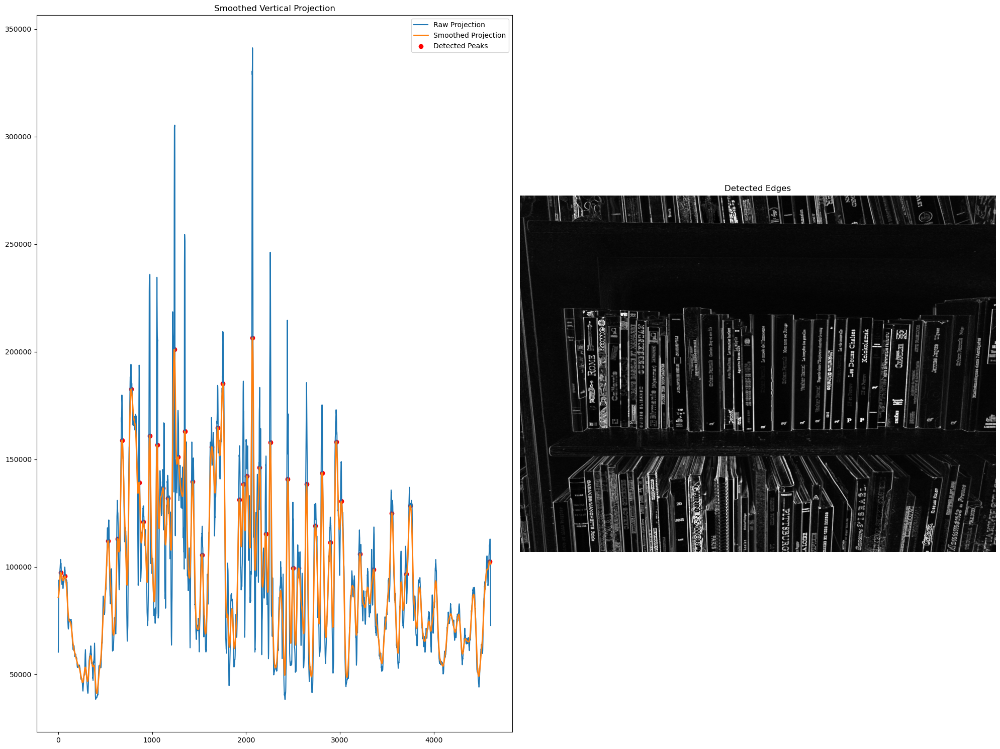

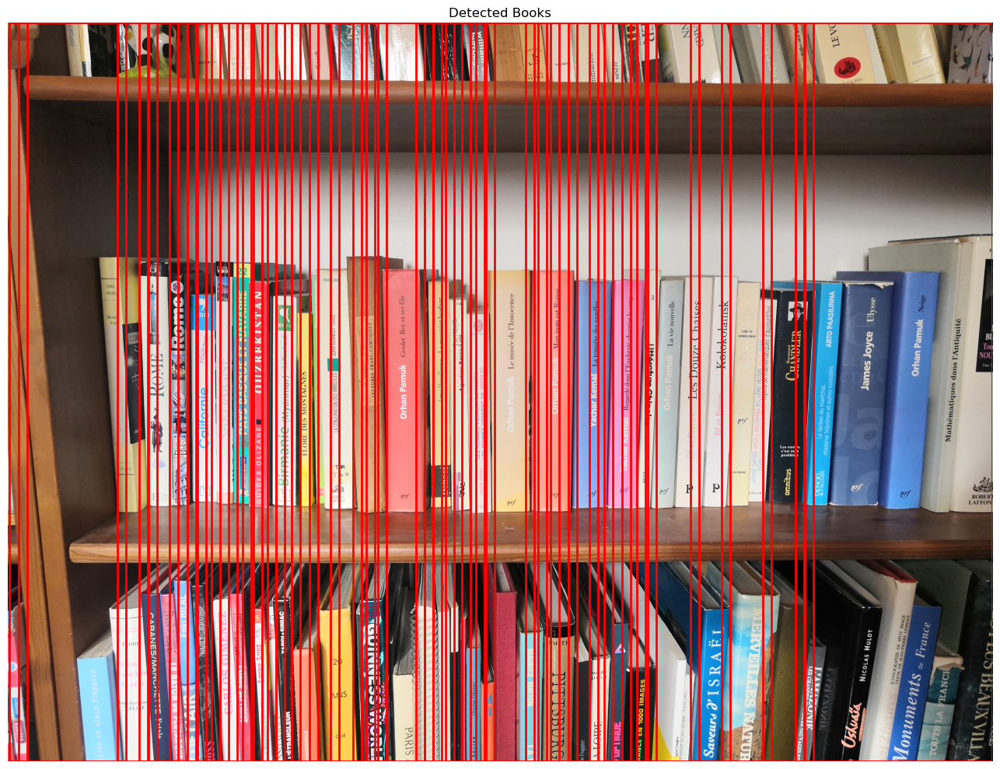

In [45]:
# Detect smoothed book boundaries
boundaries, smoothed_projection = detect_smoothed_book_boundaries(edges)

# Filter out closely spaced lines
filtered_boundaries = filter_close_peaks(boundaries, smoothed_projection, distance_threshold=20)

# Generate refined bounding boxes using filtered boundaries
book_boxes = generate_refined_book_bounding_boxes(img, filtered_boundaries)

# Visualize results
visualize_smoothed_projection_and_boxes(img, edges, smoothed_projection, filtered_boundaries, book_boxes)

In [46]:
def crop_books(image, book_boxes):
    """
    Crop the detected book regions using the bounding boxes.
    
    Args:
        image (ndarray): Input image of the bookshelf.
        book_boxes (list of tuples): Bounding boxes of books in (y_min, x_min, y_max, x_max) format.
    
    Returns:
        list of ndarray: List of cropped book images.
    """
    cropped_books = []
    for box in book_boxes:
        y_min, x_min, y_max, x_max = box
        cropped_book = image[y_min:y_max, x_min:x_max]
        cropped_books.append(cropped_book)
    return cropped_books

def display_cropped_books(cropped_books, n_cols=5):
    """
    Display a sample of cropped book images in a grid layout.
    
    Args:
        cropped_books (list of ndarray): List of cropped book images.
        n_cols (int): Number of columns in the grid layout.
    """
    n_books = len(cropped_books)
    n_rows = (n_books // n_cols) + (1 if n_books % n_cols != 0 else 0)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))
    axes = axes.ravel()
    
    for i, ax in enumerate(axes):
        if i < n_books:
            ax.imshow(cropped_books[i], cmap='gray')
            ax.axis('off')
        else:
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()

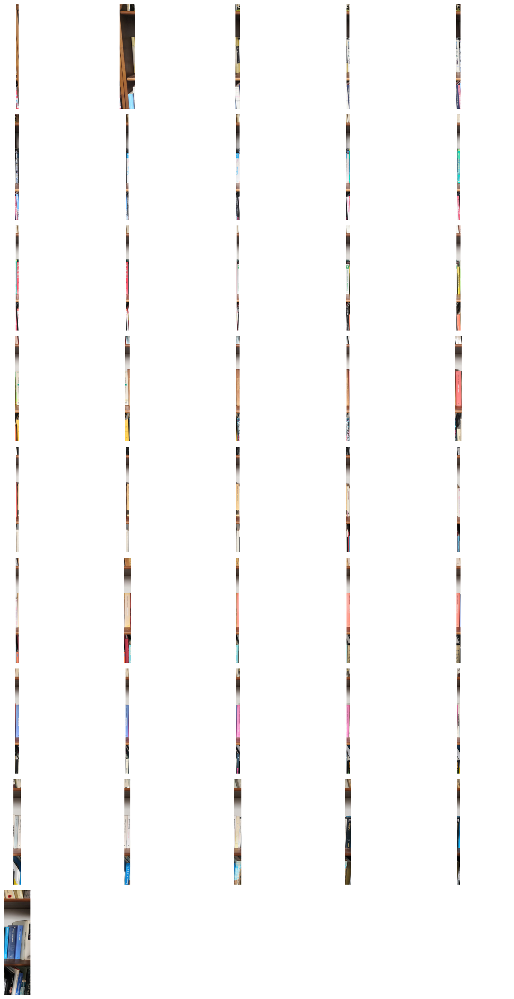

In [47]:
# Assume `img` is the input image and `book_boxes` are detected bounding boxes.

# Crop books from the image
cropped_books = crop_books(img, book_boxes)

# Display some of the cropped book images
display_cropped_books(cropped_books, n_cols=5)

In [48]:
import cv2
import pytesseract

pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'

def preprocess_and_enhance_image(image):
    """
    Preprocess and enhance the image for better OCR results.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    enhanced = cv2.equalizeHist(gray)  
    resized = cv2.resize(enhanced, None, fx=2, fy=2, interpolation=cv2.INTER_LINEAR) 
    _, binary = cv2.threshold(resized, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)  
    return binary

def extract_text_from_books(cropped_books, lang='eng'):
    """
    Extract text from preprocessed and enhanced book images using OCR.
    """
    text_list = []
    for i, book in enumerate(cropped_books):
        preprocessed_book = preprocess_and_enhance_image(book)
        
        config = "--psm 6 --oem 3"  
        text = pytesseract.image_to_string(preprocessed_book, lang=lang, config=config)
        
        text_list.append(text.strip())
        print(f"Text from book {i + 1}: {text.strip()}")
    return text_list


In [49]:
text_list = extract_text_from_books(cropped_books)

Text from book 1: :
_
, tae :
3: ‘ ,
fo 4.
7.
\
7 ‘4 t:
a =
. © ta
an ,
; BS
a
+ aw of
G
.
t
4
m
‘ a
’ woe
}
Text from book 2: b x
Ne
2 ~ : > ‘
F i
x. vi
aoe _
a
tr
*
. .
be
ee
ce oc om
EMS ht —
we : Te Tse
NR on,
SOBER fe
Pact t se! crea
ee Pts ENTREE o> io?
€¢ ert: ay i tee.
ype, Ses EN
eats
7a i Seats a
P. veo of
L. St ae
ee tah Co ao ee
cc “ sy ee ee
- Et ey SPQ, no
FOP ey OW TF
; cs a
pee ms
/ .
\ j
er: .
‘
\
,
' ‘
(
1
Text from book 3: \
)
} ,
e
~~
a st!
Gea. . |
Text from book 4: a

1
|

a

Vin

! i

|

| |

Th

Q

B =

a

nl

7

2
Text from book 5: o£
re
lt .
4
ii
t
nm
m
©
ey
5]
Text from book 6: ®
=
t
~
cab)
. \ fa]
| .
Text from book 7: eat:
|
7
AM)
Sh
¥

ve

4
Text from book 8: "
4
GA
V
¢
|
. t
- |
|
t
fo
is
4
t. ©
A
| " ry
pe
Text from book 9: \
t
f
GUIDES
V@IR i
: 9s
q oa
or on i
I
4
,
4
wf
4 |
Lot z
{— =
oe
eee»:
i -
i-- §
co”
‘
Text from book 10: ws 4
%
Py uy
.
, ja
q L A x
_
“=>
ps
4% _
% ry
“aT
ar
a
‘fr )
«ae
Le >
|
Ps Po
A
“
Ps
ax f=
i,
:
|.
Text from book 11: see sie